In [1]:
import warnings
warnings.filterwarnings('ignore')
import gc, argparse, sys, os, errno
%pylab inline
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt;
import seaborn as sns
#sns.set()
#sns.set_style('whitegrid')
import h5py
from PIL import Image
import os
from tqdm import tqdm_notebook as tqdm
import scipy
import sklearn
from scipy.stats import pearsonr
from scipy.io import loadmat
import IPython.display as ipd
import IPython
import librosa.display
import librosa
from pystoi import stoi
from mcd import dtw
import mcd.metrics as mt

Populating the interactive namespace from numpy and matplotlib


In [3]:
sys.path.append('/scratch/xc1490/projects/tmp/python_packages')
sys.path.append('/scratch/xc1490/projects/ecog/ALAE_1023/')
sys.path.append('/scratch/xc1490/projects/tmp/python_packages/') #pip install --target=/home/xc1490/home/projects/tmp/python_packages package_name
from pesq import pesq
#PESQ (Perceptual Evaluation of Speech Quality) Wrapper for Python Users
#https://github.com/ludlows/PESQ
#!pip install --target=/home/xc1490/home/projects/tmp/python_packages pesq
from metrics.pystoi_plus import stoi_plus #stoi+
#pip install --target=/home/xc1490/home/projects/tmp/python_packages https://github.com/schmiph2/pysepm/archive/master.zip
#https://github.com/schmiph2/pysepm
import pysepm
def MTF(wave, n_fft = 160):
    S = librosa.stft(wave,n_fft=n_fft)#,hop_length=hop_length) #16000 * 0.01
    F= np.fft.fftshift(np.log(np.abs(np.fft.fft2(np.log(np.abs(S))))))
    return F[ :F.shape[0]//2, F.shape[1]//2 - 10: F.shape[1]//2 + 10 ]

def MTF_corr(orig_wave, pred_wave):
    F_tmp_orig = MTF(orig_wave)
    F_tmp_pred = MTF(pred_wave)
    F_tmp_pred_1 = F_tmp_pred[-5:,F_tmp_pred.shape[1]//2 -  4: F_tmp_pred.shape[1]//2 +  4 ]
    #F_tmp_pred_2 = F_tmp_pred[-5:]
    F_tmp_orig_1 = F_tmp_orig[-5:,F_tmp_orig.shape[1]//2 -  4: F_tmp_orig.shape[1]//2 +  4 ]
    #F_tmp_orig_2 = F_tmp_orig[-5:]
    return pearsonr(F_tmp_orig.ravel(),F_tmp_pred.ravel())[0], pearsonr(F_tmp_pred_1.ravel(),F_tmp_orig_1.ravel())[0]

def mel_cep_dtw_dist(target, converted):
    """
    Compute the distance between two unaligned speech waveforms
    :param target: reference speech numpy array
    :param converted: synthesized speech numpy array
    :return: mel cep distance in dB
    """
    total_cost = 0
    total_frames = 0
    for (tar, conv) in zip(target, converted):
        tar, conv = tar.astype('float64'), conv.astype('float64')
        cost, _ = dtw.dtw(tar, conv, mt.logSpecDbDist)
        frames = len(tar)
        total_cost += cost
        total_frames += frames

    return total_cost / total_frames
def play(audio,sr=16000):
    '''
    audio: tensor, eg: ex['audio']
    '''
    if len(audio.shape) >=2:
        audio = audio.ravel()
    display(ipd.Audio(audio,rate=sr))
def plot_stft(audio,ax=None,n_fft=256,hop_length=128,show=False,n_mels=128,y_axis='mel'):
    X = librosa.stft(audio,n_fft=n_fft,hop_length=hop_length)
    if y_axis=='mel':
        #x_stft_db = librosa.feature.melspectrogram(x, sr=16000,n_fft=n_fft,win_length=win_length,hop_length=hop_length)
        S = librosa.feature.melspectrogram(audio, sr=16000,n_mels=n_mels,fmax=8000,n_fft=n_fft,hop_length=hop_length)
        #print (S.shape)
        if show:
            librosa.display.specshow(librosa.power_to_db(S,
                                              ref=np.max),
                             y_axis='mel',cmap='gray_r',ax=ax, fmax=8000)
        else:
            spec_db = librosa.power_to_db(S,ref=np.max)
            #level = 80
            #spec_db[spec_db<=-level] = -100
            #spec_db[spec_db==-level] = -100
            return spec_db
    else:
        if show:
            specshow(librosa.amplitude_to_db(abs(X)),cmap=cm.Blues,#cm.gray_r,
                                      sr=16000,ax=ax)
        else:
            return librosa.amplitude_to_db(abs(X))
    
def MSE_pcc(A,B,ax=None):
    mse =np.mean(((A - B)**2/B.var()))
    pcc = pearsonr(A.ravel(),B.ravel())[0]
    return mse,pcc
def analyze(predict,GT_STFT_test_spkr,audio_pred,audio_gt,mode='test',ind=-1,plot=False,mcd=None):
    samples = predict.shape[0]
    pcc = np.zeros([samples])
    mse = np.zeros([samples])
    for i in range(samples):
        mse[i], pcc[i] = MSE_pcc(predict[i],GT_STFT_test_spkr[i])
        #mse[i], pcc[i] = MSE_pcc(predict[i] ,GT_STFT_test_spkr[i] )
    stois = []
    timedur = 0#0.06

    for i in range(samples):
        stois.append(stoi(np.concatenate((np.ones([int(interval*timedur)]),\
                audio_pred[i*interval:(i+1)*interval],np.ones([int(interval*timedur)]))), \
                          np.concatenate((np.ones([int(interval*timedur)]),\
                audio_gt[i*interval:(i+1)*interval],np.ones([int(interval*timedur)]))), 16000, extended=False))
    stois = np.array(stois)
    if plot:
        if mcd is not None:
            fig,ax=plt.subplots(1,4,figsize=(18,4))
            ax[3].hist(mcd,bins=50,color='m')
            ax[3].set_title(mode+' MCD: %g(%g)' %(np.round(mcd.mean(),3),np.round(mcd.std(),3)))
        else:
            fig,ax=plt.subplots(1,3,figsize=(20,4))
        #fig,ax=plt.subplots(1,3,figsize=(18,4))
        ax[0].hist(mse,bins=25,color='b')
        ax[0].set_title('ind '+str(ind)+' '+mode+' MSE: %g(%g)' %(np.round(mse.mean(),3),np.round(mse.std(),3)))
        ax[1].hist(pcc,bins=50,color='g')
        ax[1].set_title(mode+' PCC: %g(%g)' %(np.round(pcc.mean(),3),np.round(pcc.std(),3)))
        ax[2].hist(stois,bins=50,color='r')
        ax[2].set_title(mode+' STOI: %g(%g)' %(np.round(stois.mean(),3),np.round(stois.std(),3)))
    return mse,pcc,stois
def play(audio,sr=16000):
    '''
    audio: tensor, eg: ex['audio']
    '''
    if len(audio.shape) >=2:
        audio = audio.ravel()
    display(ipd.Audio(audio,rate=sr))
    
def amplitude(x,noise_db=-50,max_db=22.5,trim_noise=True):
   if trim_noise:
      x_db = (x+1)/2*(max_db-noise_db)+noise_db
      if type(x) is np.ndarray:
         return 10**(x_db/10)*(x_db>noise_db).astype(np.float32)
      else:
         return 10**(x_db/10)*(x_db>noise_db).float()
   else:
      return 10**(((x+1)/2*(max_db-noise_db)+noise_db)/10)
    
def log_spec_dB_dist(x, y):
    log_spec_dB_const = 10.0 / math.log(10.0) * math.sqrt(2.0)
    diff = x - y
    
    return log_spec_dB_const * math.sqrt(np.inner(diff, diff))
    
interval = 16383

def gradient_func(val):
    row, col = val.split('|')
    row, col = int(row), int(col)
    split1, split2 = df.iloc[row, col].split('/') #metric
    format_use = float(split2)*100
    color = 'black'#{'pass': 'green', 'fail': 'red', 'warn': 'orange'}.get(status, 'gray')
    if col!=4: 
        return '<a href="{sample_id}/result_final_{sample_id}.html" style="color: {color}"><span style="background: linear-gradient(90deg, rgba(61,164,166,1) {format_use}%, transparent 0%)">{split1:.3f}|{split2:.3f}</span></a>'.format(
            sample_id= df.columns[col][2:] ,  color=color, split1=float(split1),split2=float(split2),format_use=format_use)
    else:
        return '<span style="background: linear-gradient(90deg, rgba(61,164,166,1) {format_use}%, transparent 0%)">{split1:.3f}|{split2:.3f}</span>'.format(
            sample_id=df.columns[col], area_id =df.index[row], color=color, split1=float(split1),split2=float(split2),format_use=format_use)

#df_index.style.format(style_func)
def display_dataframe(df, filename=None, encoding='utf-8', format='csv', type='button',gradientfunc=False, **kwargs):
    #display(df)
    #if isinstance(df, pd.DataFrame):
    #    display(df.style.set_caption(filename))
    #else:
    if gradientfunc == False:
        display(df.style.set_caption(filename))    
    else:
        display(df.style.format(gradient_func).set_caption(filename)) 
    if filename is None:
        filename = "dataframe"
    if format == 'csv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/csv'
        filename = filename + '.csv'
    elif format == 'tsv':
        data = df.to_csv(**kwargs)
        mime_type = 'text/plain'
        filename = filename + '.txt'
    else:
        raise ValueError('unknown file format: {}'.format(format))
    data = 'data:{mime_type};base64,'.format(mime_type=mime_type) + str(b64encode(bytes(data, encoding=encoding)), encoding=encoding)
    if type == 'hyperlink':
        display(HTML('<a href=" " download={filename} target="_blank">{filename}</a >'.format(
            mime_type=mime_type, filename=filename, data=data)))
    elif type == 'button':
        button_id = 'button_{}'.format(np.random.randint(1000000000))
        display(HTML(r'<input type="button" id="{0}" value="Download">'.format(button_id)))
        display(HTML('''<script>
    document.getElementById("{button_id}").addEventListener("click", function(event){{
        var filename = "{filename}";
        var data = "{data}";
        const element = document.createElement('a');
        element.setAttribute('href', data);
        element.setAttribute('download', filename);
        element.style.display = 'none';
        document.body.appendChild(element);
        element.click();
        document.body.removeChild(element);
    }});
</script>'''.format(button_id=button_id, filename=filename, data=data)))
        
from matplotlib.backends.backend_pdf import PdfPages, PdfFile
from IPython.display import HTML, display, FileLink
from base64 import b64encode, b64decode
from io import StringIO, BytesIO
from contextlib import contextmanager

#.wav: wave_rec; wave_rec_ecog:ecog.wav; 
DEBUG = False
def get_result_dict(model_dir, sampleind):
    #print ([int(i.split('.')[1].split('_')[-1]) for i in os.listdir(model_dir) if i.endswith('npy')])
    epooch = int(np.max([int(i.split('_')[1] ) for i in os.listdir(model_dir) if i.endswith('.png.wav')]))
    print ('max epoch', epooch)
    result_dict = {}#np.load(model_dir+'sample_{}_NY{}.png_sample_npy_{}.npy'.format(epooch,sampleind,epooch),allow_pickle=1).item()
    #print (result_dict.keys())
    wave_key_list = ['wave_org','wave_rec_ecog','wave_rec' ]
    print (model_dir.split('_ldw_')[0].split('_')[-1]) 
    wave_gt = np.load('/scratch/xc1490/projects/ecog/ALAE_1023/data/data/LD_gt_wave/NY{}.npy'.format(sampleind ))
    result_dict['wave_org'] = wave_gt
    result_dict['wave_rec_ecog'] =librosa.core.load(model_dir+'sample_{}_NY{}.pngecog.wav'.format(epooch,sampleind),sr=16000)[0]
    result_dict['wave_rec'] =librosa.core.load(model_dir+'sample_{}_NY{}.png.wav'.format(epooch,sampleind),sr=16000)[0]
    
    if DEBUG:
        display(ipd.Audio(wave_gt ,rate=16000))
        display(ipd.Audio(result_dict['wave_rec_ecog'] ,rate=16000))
        display(ipd.Audio(result_dict['wave_rec'] ,rate=16000))
    return result_dict

def get_result_dict(model_dir, sampleind):
    #print ([int(i.split('.')[1].split('_')[-1]) for i in os.listdir(model_dir) if i.endswith('npy')])
    #import pdb; pdb.set_trace()
    epooch = int(np.max([int(i.split('.')[1].split('_')[-1]) for i in os.listdir(model_dir) if i.endswith('npy')]))
    print ('max epoch', epooch)
    result_dict = np.load(model_dir+'sample_{}_NY{}.png_sample_npy_{}.npy'.format(epooch,sampleind,epooch),allow_pickle=1).item()
    #print (result_dict.keys())
    wave_key_list = [ 'wave_rec','wave_rec_denoise','wave_rec_ecog','wave_rec_ecog_denoise']
    for key in result_dict.keys():
        if key!='components' and key!='components_ecog' and key!='lable':
            #print (key)
            #print (key,result_dict[key].shape)
            #if key =='org_denoise':
            #    result_dict[key] = amplitude(result_dict[key])
            if key =='rec_denoise' or key =='rec_ecog' or key =='rec_ecog_denoise' or key =='org' or key =='rec':
                result_dict[key] = (result_dict[key]-0.5)*2
            if key in wave_key_list:
                #print (key)
                #import pdb;pdb.set_trace()
                factor = np.sqrt(sum(result_dict['wave_org']**2)/sum(result_dict[key]**2))
                result_dict[key] = result_dict[key]*factor
    for key in ['org','rec','rec_ecog','rec_ecog_denoise','rec_ecog','rec_denoise']:
        result_dict[key] = np.swapaxes(result_dict[key].reshape(256,50,-1),1,0)
    return result_dict

sample_num = 50
def get_metric_from_result_dict(result_dict,fs = 16000):
    wave_gt = result_dict['wave_org'].ravel()#[10*interval:]
    wave_pred =result_dict['wave_rec_ecog'][:819582//interval*interval].ravel()#[10*interval:]

    spec_pred_mel = np.zeros([sample_num,32,127])
    spec_gt_mel = np.zeros([sample_num,32,127])

    for i in  range(sample_num):
        spec_pred_mel[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None ,y_axis='mel',n_mels=32)
        spec_gt_mel[i] = plot_stft(wave_gt[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None,y_axis='mel',n_mels=32 )
    spec_concat_e2a = np.concatenate(( np.flip(spec_gt_mel,axis=1), np.flip(spec_pred_mel,axis=1)),axis=1)
    
    mse_test_e2a,pcc_test_e2a,stois_test_e2a = analyze(spec_pred_mel,spec_gt_mel,wave_pred,wave_gt,plot=False,mcd=None)


    wave_pred =result_dict['wave_rec'][:819582//interval*interval].ravel()#[10*interval:]
    MTF_cc_a2a = np.zeros([sample_num])
    MTF_cc_a2a1 = np.zeros([sample_num])
    for i in  range(sample_num):
        MTF_cc_a2a[i],MTF_cc_a2a1[i] = MTF_corr(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval])
    
    stoi_extended_a2a = np.array([stoi(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs, extended=True) for i in   range(sample_num) ])
    stoi_plus_a2a = np.array([stoi_plus(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs, extended=False) for i in   range(sample_num) ])
    pesq_wb_a2a = np.zeros([sample_num])
    pesq_wb_a2a[:] = numpy.nan
    for i in range(sample_num) :
        try:
            pesq_wb_a2a[i] =  pesq(fs, wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], 'wb') 
        except:
            pass
    pesq_nb_a2a = np.zeros([sample_num])
    pesq_nb_a2a[:] = numpy.nan
    for i in range(sample_num) :
        try:
            pesq_nb_a2a[i] =  pesq(fs, wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], 'nb') 
        except:
            pass
    csii_a2a = np.array([pysepm.csii(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs ) for i in  range(sample_num) ])
    ncm_a2a = np.zeros([sample_num]) #np.array([pysepm.ncm(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs ) for i in  range(sample_num) ])
    
    
    #stoi(gt_audio, pred_audio, fs, extended=False)
    #stoi(gt_audio, pred_audio, fs, extended=True)
    #stoi_plus(gt_audio, pred_audio, fs, extended=False)
    #pesq(fs, gt_audio, pred_audio, 'wb')  #pesq_batch for batch processing
    #pesq(fs, gt_audio, pred_audio, 'nb')
    #pysepm.csii(gt_audio, pred_audio, fs) #high, mid, low
    #pysepm.ncm(gt_audio, pred_audio, fs)
    
    spec_pred_mel = np.zeros([sample_num,32,127])
    spec_gt_mel = np.zeros([sample_num,32,127])

    for i in  range(sample_num):
        spec_pred_mel[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None ,y_axis='mel',n_mels=32)
        spec_gt_mel[i] = plot_stft(wave_gt[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None,y_axis='mel',n_mels=32 )
    spec_concat_a2a = np.concatenate(( np.flip(spec_gt_mel,axis=1), np.flip(spec_pred_mel,axis=1)),axis=1)
    

    
    mse_test_a2a,pcc_test_a2a,stois_test_a2a = analyze(spec_pred_mel,spec_gt_mel,wave_pred,wave_gt,plot=False,mcd=None)

    #mfcc e2a
    wave_pred =result_dict['wave_rec_ecog'][:819582//interval*interval].ravel()#[10*interval:]
    
    MTF_cc_e2a = np.zeros([sample_num])
    MTF_cc_e2a1 = np.zeros([sample_num])
    for i in  range(sample_num):
        MTF_cc_e2a[i],MTF_cc_e2a1[i] = MTF_corr(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval])
    stoi_extended_e2a = np.array([stoi(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs, extended=True) for i in  range(sample_num)])
    stoi_plus_e2a = np.array([stoi_plus(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs, extended=False) for i in  range(sample_num)])
    pesq_wb_e2a = np.zeros([sample_num])
    pesq_wb_e2a[:] = numpy.nan
    for i in  range(sample_num):
        try:
            pesq_wb_e2a[i] =  pesq(fs, wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], 'wb') 
        except:
            pass
    pesq_nb_e2a = np.zeros([sample_num])
    pesq_nb_e2a[:] = numpy.nan
    for i in  range(sample_num):
        try:
            pesq_nb_e2a[i] =  pesq(fs, wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], 'nb') 
        except:
            pass
    csii_e2a = np.array([pysepm.csii(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs ) for i in  range(sample_num)])
    ncm_e2a =  np.zeros([sample_num])#np.array([pysepm.ncm(wave_gt[i*interval:(i+1)*interval], wave_pred[i*interval:(i+1)*interval], fs ) for i in  range(sample_num)])
    
    
    
    spec_pred = np.zeros([sample_num,32,32])
    spec_gt = np.zeros([sample_num,32,32])
    mfcc_e2a = np.zeros([sample_num])
    for i in  range(sample_num):
        spec_pred[i] = librosa.feature.mfcc(y=wave_pred[i*interval:(i+1)*interval], sr=16000,n_mfcc=32)
        spec_gt[i] = librosa.feature.mfcc(y=wave_gt[i*interval:(i+1)*interval], sr=16000,n_mfcc=32)
        mfcc_e2a[i] = pearsonr(spec_pred[i].ravel(),spec_gt[i].ravel())[0]

    #mfcc a2a
    wave_pred =result_dict['wave_rec'][:819582//interval*interval].ravel()#[10*interval:]
    spec_pred = np.zeros([sample_num,32,32])
    spec_gt = np.zeros([sample_num,32,32])

    mfcc_a2a = np.zeros([sample_num])
    for i in  range(sample_num):
        spec_pred[i] = librosa.feature.mfcc(y=wave_pred[i*interval:(i+1)*interval], sr=16000,n_mfcc=32)
        spec_gt[i] = librosa.feature.mfcc(y=wave_gt[i*interval:(i+1)*interval], sr=16000,n_mfcc=32)
        mfcc_a2a[i] = pearsonr(spec_pred[i].ravel(),spec_gt[i].ravel())[0]

    components_keys = ['f0','loudness', 'amplitudes', 'amplitudes_h', 'freq_formants_hamon_hz', 'bandwidth_formants_hamon_hz', 'amplitude_formants_hamon','freq_formants_noise_hz', 'bandwidth_formants_noise_hz', 'amplitude_formants_noise']
    components_pcc = {}
    #for key in components_keys:
    #    components_pcc[key] = np.zeros([50])
    #    for i in range(50):
    #        components_pcc[key][i] =pearsonr((result_dict['components'][key][i] *(result_dict['components']['amplitudes'][i,0:1,:]  >=0.2)).ravel(),\
    #                        (result_dict['components_ecog'][key][i] *(result_dict['components']['amplitudes'][i,0:1,:]  >=0.2)).ravel())[0]
    #    #print (key,result_dict['components'][key].shape,np.mean(components_pcc[key]))
    return mse_test_e2a, pcc_test_e2a, stois_test_e2a, None, mfcc_e2a, \
            mse_test_a2a, pcc_test_a2a, stois_test_a2a, None, mfcc_a2a, components_pcc, MTF_cc_a2a, MTF_cc_e2a, \
            MTF_cc_a2a1, MTF_cc_e2a1, stoi_extended_a2a, stoi_plus_a2a, pesq_wb_a2a, pesq_nb_a2a, csii_a2a, ncm_a2a,\
            stoi_extended_e2a, stoi_plus_e2a, pesq_wb_e2a, pesq_nb_e2a, csii_e2a, ncm_e2a

import json
with open('/scratch/xc1490/home/projects/ecog/ALAE_1023/AllSubjectInfo.json','r') as rfile:
    allsubj_param = json.load(rfile)

def display_and_plot(pcc_onset, result_dict,sample_ind):
    subj_param = allsubj_param['Subj']['NY'+str(sample_ind)]
    Gender = subj_param['Gender']
    print ('*'*20,sample_ind, Gender,'*'*20)
    wave_gt = result_dict['wave_org'].ravel()
    wave_pred_a2a = result_dict['wave_rec'].ravel()
    wave_pred = result_dict['wave_rec_ecog'].ravel()
    wave_merge = np.concatenate(([np.concatenate((wave_gt[i*interval:(i+1)*interval],wave_pred[i*interval:(i+1)*interval]))\
                     for i in range(50)]))

    print ('original')
    display(ipd.Audio(wave_gt.reshape(50,-1)[np.argsort(-pcc_onset)].ravel(),rate=16000))
    print ('a2a pred')
    display(ipd.Audio(wave_pred_a2a.reshape(50,-1)[np.argsort(-pcc_onset)].ravel(),rate=16000))
    print ('e2a pred')
    display(ipd.Audio(wave_pred.reshape(50,-1)[np.argsort(-pcc_onset)].ravel(),rate=16000))
    print ('merge of orig and e2a pred')
    display(ipd.Audio(wave_merge.reshape(50,-1)[np.argsort(-pcc_onset)].ravel(),rate=16000))
    if Gender == 'Female':
        N_FFT = 511 
        plot_factor = 1
    else:
        N_FFT =1023
        plot_factor = 1.6
    spec_dim = 127
    spec_pred = np.zeros([50,(N_FFT+1)//2,spec_dim])
    spec_gt = np.zeros([50,(N_FFT+1)//2,spec_dim])
    try:
        select_word = np.loadtxt('/scratch/xc1490/home/projects/ecog/ALAE_1023/data/wordlist_NY{}.txt'.format(sample_ind),dtype='str')
    except:
        select_word = np.array(['' for i in range(50)])
    #print (select_word)
    
    
    #MTF(wave, n_fft = 160)
    #import pdb; pdb.set_trace()
    #np.concatenate([wave_pred[i*interval:(i+1)*interval] for i in range(50)])
    for i in range(50):
        spec_pred[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=N_FFT,hop_length=129,ax=None ,y_axis='linear',n_mels=32)
        spec_gt[i] = plot_stft(wave_gt[i*interval:(i+1)*interval],n_fft=N_FFT,hop_length=129,ax=None,y_axis='linear',n_mels=32 )
        #spec_pred[i] = plot_stft(wave_pred[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None ,y_axis='linear',n_mels=256)
        #spec_gt[i] = plot_stft(wave_gt[i*interval:(i+1)*interval],n_fft=511,hop_length=129,ax=None,y_axis='linear',n_mels=256 )
    spec_concat = np.concatenate(( np.flip(spec_gt,axis=1), np.flip(spec_pred,axis=1)),axis=1)

    
    row_nums = 5
    col_nums = 10
    fig,ax=plt.subplots(row_nums,col_nums,figsize=(col_nums*1.4,row_nums*4*plot_factor))
    cmap = cm.gray_r
    for i in range(row_nums):
        for j in range(col_nums):
            ax[i,j].imshow(spec_concat[np.argsort(-pcc_onset)[i*col_nums+j]] ,cmap=cmap)
            #try:
            ax[i,j].set_title(select_word[np.argsort(-pcc_onset)[i*col_nums+j]]+' {0:.3g}'.format(pcc_onset[np.argsort(-pcc_onset)[i*col_nums+j]]))
                #ax[i,j].set_title(select_word[np.argsort(-pcc_test)[i*col_nums+j]]+' {0:.3g}'.format(-np.sort(-pcc_test)[i*col_nums+j]))
            #except:
            #    pass

    plt.tight_layout()
    plt.show()

In [4]:
import json
with open('/scratch/xc1490/projects/ecog/ALAE_1023/AllSubjectInfo.json','r') as rfile:
    allsubj_param = json.load(rfile)
total_samples = np.sort([sample for sample in allsubj_param['Subj'].keys() if \
                          allsubj_param['Subj'][sample]['Density'] == 'LD' and 'female' not in sample])


In [8]:
model_dir = ['../output/resnet_NY869/']
sample_inds_use = np.repeat('869',len(model_dir))

0it [00:00, ?it/s]

max epoch 51
************************* 869 *************************
../output/resnet_NY869/
******************** 869 Male ********************
original


a2a pred


e2a pred


merge of orig and e2a pred


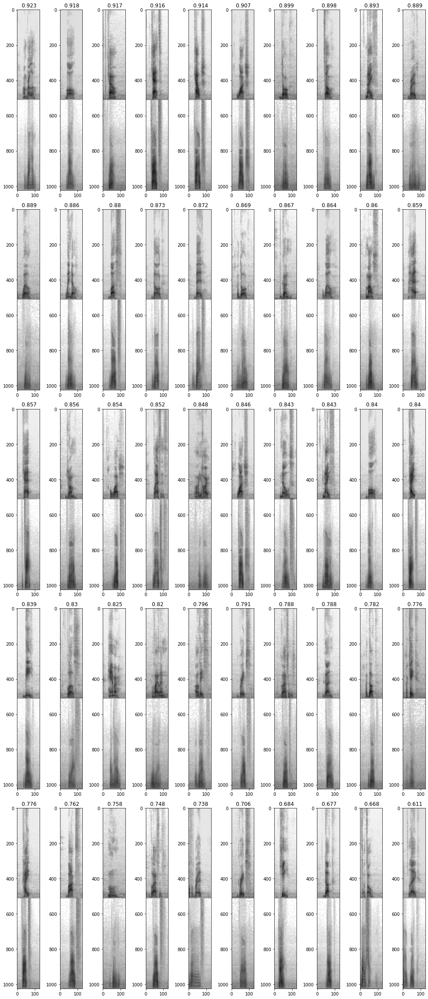

In [12]:
mse_test_e2a_dict, pcc_test_e2a_dict, stois_test_e2a_dict, mcd_e2a_dict, mfcc_e2a_dict, \
  mse_test_a2a_dict, pcc_test_a2a_dict, stois_test_a2a_dict, mcd_a2a_dict, mfcc_a2a_dict, \
    components_pcc_dict, MTF_cc_a2a_dict, MTF_cc_e2a_dict, MTF_cc_a2a_dict1, MTF_cc_e2a_dict1,\
    stoi_extended_a2a_dict, stoi_plus_a2a_dict, pesq_wb_a2a_dict, pesq_nb_a2a_dict, csii_a2a_dict, ncm_a2a_dict,\
    stoi_extended_e2a_dict, stoi_plus_e2a_dict, pesq_wb_e2a_dict, pesq_nb_e2a_dict, csii_e2a_dict, ncm_e2a_dict = \
            {},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{},{}
count = 0
sample_ind_correct1 = np.arange(len(sample_inds_use))
for ind, sample_ind_ in tqdm(enumerate(sample_inds_use  )):
    try:
        result_dict = get_result_dict(model_dir[ind],sample_ind_)
        sample_ind = sample_ind_
        print ('*'*25,sample_ind,'*'*25)
        print (model_dir[ind])
        mse_test_e2a_dict[sample_ind], pcc_test_e2a_dict[sample_ind], stois_test_e2a_dict[sample_ind], \
        mcd_e2a_dict[sample_ind], mfcc_e2a_dict[sample_ind], mse_test_a2a_dict[sample_ind], pcc_test_a2a_dict[sample_ind],\
        stois_test_a2a_dict[sample_ind], mcd_a2a_dict[sample_ind], mfcc_a2a_dict[sample_ind], components_pcc_dict[sample_ind], \
        MTF_cc_a2a_dict[sample_ind], MTF_cc_e2a_dict[sample_ind],MTF_cc_a2a_dict1[sample_ind], MTF_cc_e2a_dict1[sample_ind],\
        stoi_extended_a2a_dict[sample_ind], stoi_plus_a2a_dict[sample_ind], pesq_wb_a2a_dict[sample_ind], pesq_nb_a2a_dict[sample_ind],\
        csii_a2a_dict[sample_ind], ncm_a2a_dict[sample_ind],stoi_extended_e2a_dict[sample_ind], stoi_plus_e2a_dict[sample_ind], pesq_wb_e2a_dict[sample_ind],\
        pesq_nb_e2a_dict[sample_ind], csii_e2a_dict[sample_ind], ncm_e2a_dict[sample_ind] \
        = get_metric_from_result_dict(result_dict)

        pcc_onset = pcc_test_e2a_dict[sample_ind]
        display_and_plot(pcc_onset, result_dict,sample_ind_)
        count += 1
    except:
        print (sample_ind_, 'error')
        sample_ind_correct1 = np.setdiff1d(sample_ind_correct1, np.array([ind]))


In [13]:
model_name = 'ResNet'

mse_new = np.zeros([4,count ])#actually a2a 4 metric* 3 sample

for j in range(len(sample_ind_correct1)):
    mse_new[0,j] = np.mean(pcc_test_a2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    mse_new[1,j] = np.mean(stois_test_a2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    mse_new[2,j] = np.mean(mfcc_a2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    mse_new[3,j] = np.mean(MTF_cc_a2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    #mse_new[3,j] = np.mean(mcd_a2a_dict[sample_inds[j]])

pcc_new = np.zeros([4,count ])#actually e2a 4 metric* 3 sample


for j in range(count ):
    pcc_new[0,j] = np.mean(pcc_test_e2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    pcc_new[1,j] = np.mean(stois_test_e2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    pcc_new[2,j] = np.mean(mfcc_e2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    pcc_new[3,j] = np.mean(MTF_cc_e2a_dict[sample_inds_use[sample_ind_correct1[j]]])
    #pcc_new[3,j] = np.mean(mcd_e2a_dict[sample_inds[j]])

df_new = pd.DataFrame(np.zeros([4,count ]))
df_new = df_new.astype('str')
for i in range(4):
    for j in range(count ):
        df_new.iloc[i,j] = str(mse_new[i,j])+'/' +str(pcc_new[i,j])
#for i in range(3):
#    df_new.iloc[i,count ] = str(np.round(np.mean(mse_new[i,:]),3))+'/' +str(np.round(np.mean(pcc_new[i,:]),3))
df_new.columns = ['NY{}'.format(sample_inds_use[sample_ind]) for sample_ind in sample_ind_correct1] #+ ['Average']
df_new.index = ['SPEC PCC','STOI','MFCC PCC','MTF PCC' ]

df = df_new
df_index =  pd.DataFrame(np.array([(str(i)+'|'+str(j)) for i in range(df.shape[0]) \
                                   for j in range(df.shape[1])]).reshape(df.shape[0],-1))
df_index.index = df.index
df_index.columns = df.columns

#df.to_csv('formant_metric_summary_{}.csv'.format(model_dir.split('/')[1]))
#except:
#    print (  'error')

display_dataframe(df_index.T,gradientfunc=True,filename='overall performance')
genderlist = [allsubj_param['Subj']['NY'+str(sample_ind.split('_')[0])]['Gender'] for sample_ind in np.array(sample_inds_use)[sample_ind_correct1]]
print ('\n')
print ('-'*100,'\n')
print ('{} Patients, {} Female Patients, {} Male Patients'.format(len(sample_inds_use), genderlist.count('Female'), genderlist.count('Male')))
print ('\n')
print ('-'*100,'\n')
print ('Patient List: ',['NY'+str(sample_ind)  for sample_ind in sample_inds_use])  #patient list
print ('\n')
print ('-'*100,'\n')
print ('Patient Gender: ',{'NY'+str(sample_ind):allsubj_param['Subj']['NY'+str(sample_ind.split('_')[0])]['Gender']  for sample_ind in sample_inds_use})  #patient gender


task = ['Reference','Decoded']

,SPEC PCC,STOI,MFCC PCC,MTF PCC
NY869,0.938|0.829,0.800|0.590,0.989|0.964,0.689|0.663




---------------------------------------------------------------------------------------------------- 

1 Patients, 0 Female Patients, 1 Male Patients


---------------------------------------------------------------------------------------------------- 

Patient List:  ['NY869']


---------------------------------------------------------------------------------------------------- 

Patient Gender:  {'NY869': 'Male'}
